# Problem Description
The following notebook if for an assignment in my U Colorado Deep Learning class.  I am to exercise skills demostrating the use of GAN Deep Learning techniques to take a test set of photos and generate photos with a Claude Monet style.  I am going to use a set of provided Monet images and use a Generator and a Discriminator in an GAN  Generative Adversarial Network approach and I will submit the transformed images back to a Kaggle competition.

 The generated photos will be evaluated with an MiFID (Memorization-informed Fréchet Inception Distance) with the goal of minimizing the MFID.  The memorization distance is defined as the minimum cosine distance of all training samples in the feature space, averaged across all user generated image samples. This distance is thresholded, and it's assigned to 1.0 if the distance exceeds a pre-defined epsilon.

Competition details including data and evaluation criteria can be found at https://www.kaggle.com/competitions/gan-getting-started/overview

### Import Libraries

In [1]:
# basic Libraries
import numpy as np
import os
import zipfile
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings('ignore')


# TensorFlow and Keras Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, initializers, Sequential
!pip install tensorflow-addons
import tensorflow_addons as tfa
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy


### Loading the data

I am loading my data from my Google Drive then extracting the TFREC files and loading into datasets

In [2]:

monet_files = tf.data.Dataset.list_files("/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec")
photo_files = tf.data.Dataset.list_files("/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec")


In [3]:


# Function to parse data
def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [256, 256, 3])
    return image

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    return dataset

monet_ds = load_dataset(monet_files)
photo_ds = load_dataset(photo_files)

## Data Description

The Data consists of two sets of images in TFREC format.  The input images are 7038 photos provided by Kaggle.  The target images are 300  Monet paintings.  Each image is a 256 x 256 3channel RGB image.   

# EDA  Exploratory Data Analysis

### Visualize the data
Let's look at some of the photos and some of the Monet images from the input data

In [4]:
# check the Number of Images:
num_monet = len(list(monet_ds))
num_photos = len(list(photo_ds))
print(f"Number of Monet paintings: {num_monet}")
print(f"Number of Photos: {num_photos}")

Number of Monet paintings: 300
Number of Photos: 7038


In [5]:
for item in monet_ds.take(1):
    print(item.shape)


(256, 256, 3)


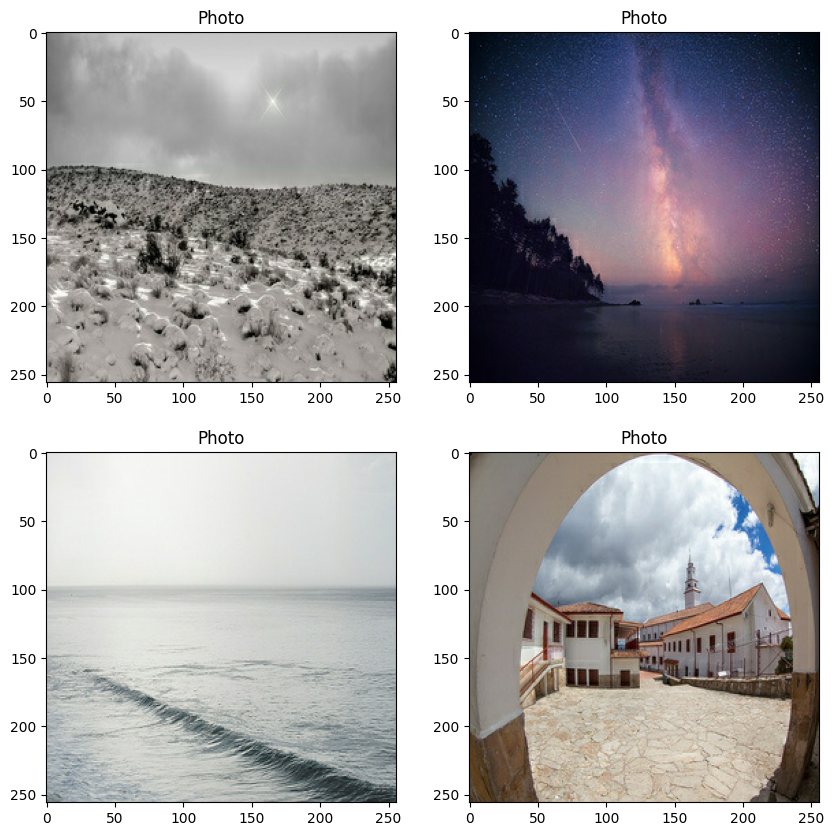

In [6]:
# display some Photo images
plt.figure(figsize=(10, 10))

for i, image in enumerate(photo_ds.take(4)):
    plt.subplot(2, 2, i+1)
    plt.imshow(tf.cast(image, tf.float32)/255.0)  # Casting to float32
    plt.title("Photo")

plt.show()

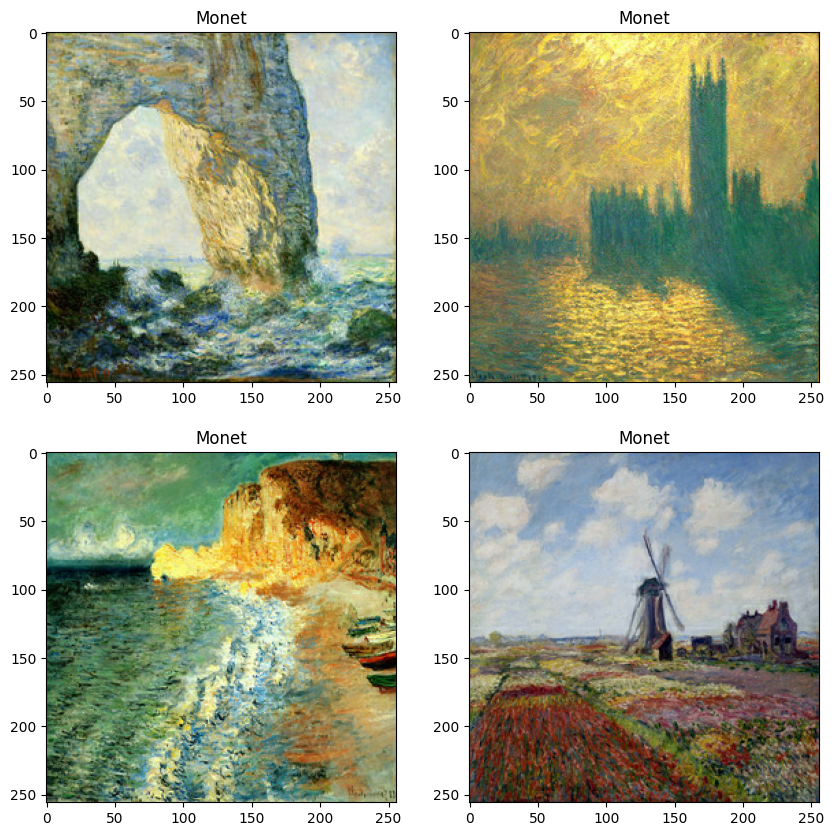

In [7]:
# display some Monet images
plt.figure(figsize=(10, 10))

for i, image in enumerate(monet_ds.take(4)):
    plt.subplot(2, 2, i+1)
    plt.imshow(tf.cast(image, tf.float32)/255.0)  # Casting to float32
    plt.title("Monet")

plt.show()

In [8]:
# check Image Sizes:
image_shapes = []

for image in monet_ds:
    image_shapes.append(image.shape)

for image in photo_ds:
    image_shapes.append(image.shape)

unique_shapes = set(image_shapes)
print(f"Unique Image Shapes: {unique_shapes}")


Unique Image Shapes: {TensorShape([256, 256, 3])}


In [9]:
# pixel statistics:

pixel_values = []
for image in monet_ds.take(100):  # Taking a sample
    pixel_values.extend(image.numpy().reshape(-1))

pixel_values = np.array(pixel_values)
print(f"Mean Pixel Value: {pixel_values.mean()}")
print(f"Pixel Standard Deviation: {pixel_values.std()}")

Mean Pixel Value: 129.58398880004881
Pixel Standard Deviation: 58.57603443490299


# Data Preprocessing   

Here we will perform data augmentation with a method that provides random changes to the images like horizontal flips, rotation and zooming.  This will assist in making the model more generalizable.

In [10]:
from tensorflow.keras.layers.experimental import preprocessing

# define augmentation layers outside the function
random_flip_layer = preprocessing.RandomFlip(mode="horizontal")
random_rotation_layer = preprocessing.RandomRotation(0.11)
random_zoom_layer = preprocessing.RandomZoom(0.1)
random_contrast_layer = preprocessing.RandomContrast(0.2)

def augment_image(image):
    # random flip (horizontal and vertical)
    image = random_flip_layer(image)

    # random rotation (within 40 degrees)
    image = random_rotation_layer(image)

    # random zoom (up to 20% zoom)
    image = random_zoom_layer(image)

    # random contrast adjustment
    image = random_contrast_layer(image)

    return image

# apply augmentation to the Monet dataset
augmented_monet_ds = monet_ds.map(augment_image)

In [11]:
augmented_monet_ds  = monet_ds

### Visualize some augmented Monet images

<Figure size 1200x1200 with 0 Axes>

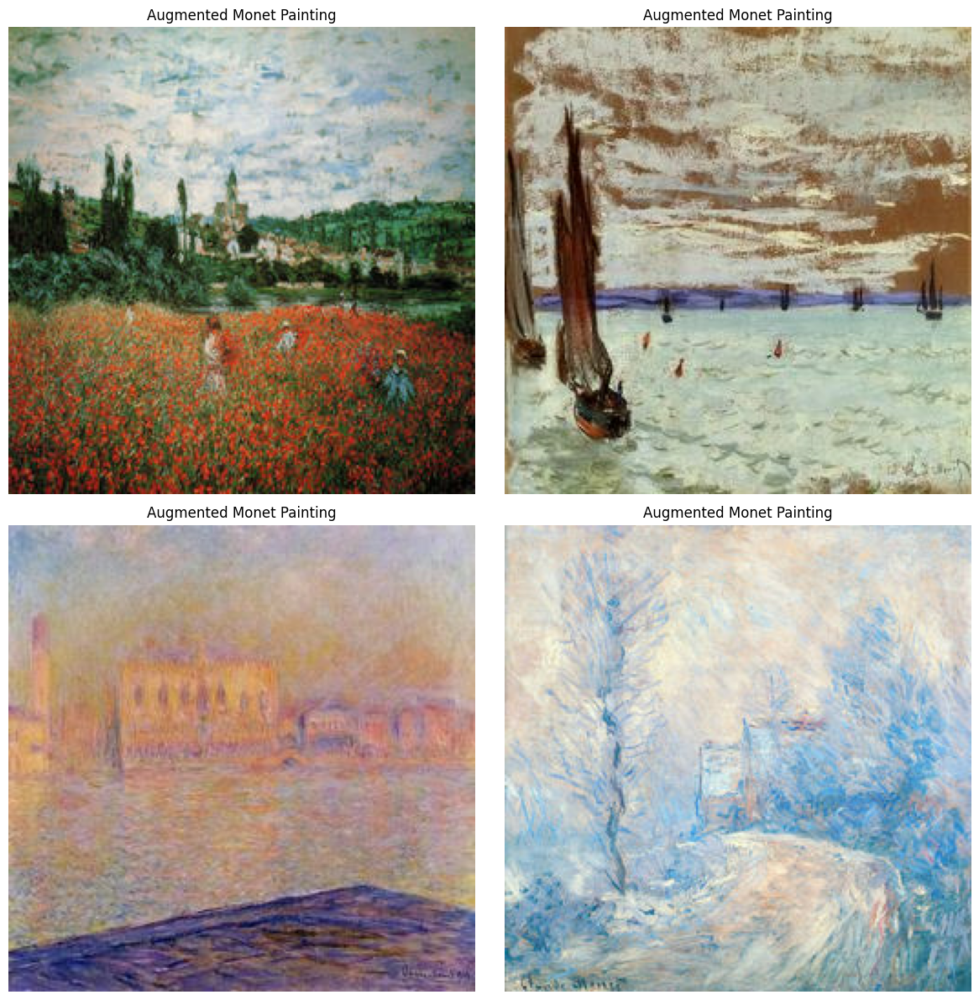

In [12]:
plt.figure(figsize=(12, 12))

plt.figure(figsize=(12, 12))

for i, image in enumerate(augmented_monet_ds.take(4)):
    plt.subplot(2, 2, i+1)
    plt.imshow(image.numpy().astype("uint8"))
    plt.title("Augmented Monet Painting")
    plt.axis("off")

plt.tight_layout()
plt.show()



# Build the GAN  including the Discriminator and Generator

### First, we are going to create a function to create a downsampling block that will be used to build the GAN.  It adds convolution layers to the model Using strides = 2 and padding of the same each layer will half the size of the input.  It also includes Instance Normalization.  It will use Leaky Relu activation.

In [13]:
def downsample(filters, size, apply_instancenorm=True):
    """
    creates a downsampling layer with instance normalization.

    parameters:
        filters (int): number of filters in the convolutional layer.
        size (int): filter size in the convolutional layer.
        apply_instancenorm (bool): choice to apply instance normalization.

    returns:
        Sequential: a Keras sequential model representing the downsampling block.
    """
    initializer = initializers.RandomNormal(mean=0., stddev=0.02)

    # initialize the sequential model
    downsample_block = Sequential()

    # Add the Conv2D layer
    downsample_block.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    # add instance normalization
    if apply_instancenorm:
        gamma_init = initializers.RandomNormal(mean=0.0, stddev=0.02)
        downsample_block.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    # add the activation
    downsample_block.add(layers.LeakyReLU())

    return downsample_block


### Now we are going to create a function to create the upsampling block which for deconvolution.  With a stride of 2 and same padding these layers will double the size.  Like the Down Sampling, instance normalization is applied.  In addition, Dropout is used for regularization to reduce overfitting.  And again Leaky Relu is the activation.  

In [14]:
def upsample(filters, size, apply_dropout=False):
    """
    creates an upsampling block for a neural network.

    parameters:
    - filters (int): the number of filters for the Conv2DTranspose layer.
    - size (int): the kernel size for the Conv2DTranspose layer.
    - apply_dropout (bool): whether to apply dropout.

    returns:
    - sequential: a Keras Sequential model representing the upsampling block.
    """
    # normal initializer with stddev = 0.02
    initializer = tf.random_normal_initializer(0., 0.02)

    # gamma initializer for instance normalization
    gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    # define the Sequential model
    upsample_block = Sequential()

    # add a Conv2DTranspose layer (upsampling layer)
    upsample_block.add(
        layers.Conv2DTranspose(filters, size, strides=2,
                               padding='same',
                               kernel_initializer=initializer,
                               use_bias=False)
    )

    # Add instance normalization
    upsample_block.add(
        tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)
    )

    # optional dropout for regularization
    if apply_dropout:
        upsample_block.add(layers.Dropout(0.5))

    # add the ReLU activation function
    upsample_block.add(layers.ReLU())

    return upsample_block


##  Creating the Generator

We will be using a U-Net architecture by  adding a series of downsampling blocks followed by upsampling blocks to reduce and increase the spatial dimenstions in each convolution layer.   Dkip connections between down and up layers helps retain spatial information.  the output layer uses a Tanh activation function to keep the pixel values  in the range [-1, 1].  The generator, as the name implies takes the photo and generates the new image.

In [15]:
def Generator(name=None):
    inputs = tf.keras.Input(shape=[256, 256, 3])  # Assuming input shape is [256, 256, 3]

    #  downsampling stack
    down_stack = [
        downsample(64, 4, apply_instancenorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    #  upsampling stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)

    # final layer to generate the output
    last = layers.Conv2DTranspose(filters=3,
                                  kernel_size=4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh')  # (bs, 256, 256, 3)

    # creating the model
    x = inputs

    # downsampling through the model with skips
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # upsampling and establishing the skips
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x, name=name)


###  Below is the generator architecture displayed

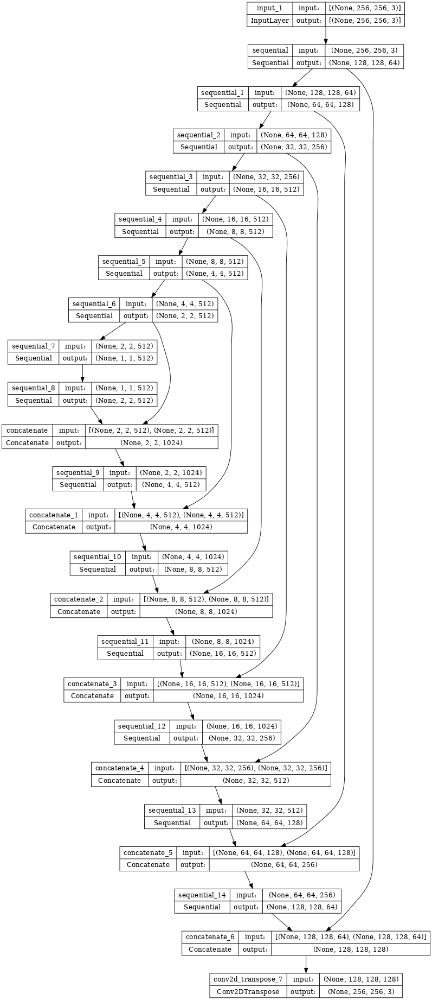

In [16]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Creating the Discrimator

This will be used to determine if the incoming image is real or fake based on the pixel values.  The Discriminator uses downsampling, padding and normalization and produces a 30, 30, 3 size output and leaky Relu activation  Instead of identifing the entire image as real or fake,  this one uses a PatchGAN approach which classifies 30 x 30 patches of the the image. It has 3 down block layers, a padding layer, instance normalization and a final layer with leaky Relu activation.  

In [17]:
def Discriminator(name=None):
    inputs = layers.Input(shape=[256, 256, 3], name='input_image')

    down1 = downsample(64, 4, apply_instancenorm=False)(inputs)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=tf.random_normal_initializer(0., 0.02),
                         use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.02))(conv)
    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)
    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=tf.random_normal_initializer(0., 0.02))(zero_pad2)  # (bs, 30, 30, 1)

    return keras.Model(inputs=inputs, outputs=last, name=name)


In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

## Creating the CycleGAN  
This does the heavy lifting in taking the input and then using the discriminator to determine real or fake images.  The Cycle GAN has two Generators a photo to Monet and a Monet to photo and two discrimninators again for A and B evaluation.  THere are mulitple loss functions used and a gradient optimizer,  These are all called by the training loop.

In [ ]:
from tensorflow.keras import Input
from tensorflow.keras.models import Model
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam

# Assume that we have defined functions Generator and Discriminator before...

# Define custom loss functions
def generator_loss(generated):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

def discriminator_loss(real, generated):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def calc_cycle_loss(real_image, cycled_image, LAMBDA):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

def identity_loss(real_image, same_image, LAMBDA):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

def CycleGAN(
    lambda_cycle=10.0,
    lambda_id=1.0,
    optimizer=Adam(2e-4, beta_1=0.5),
    loss_fn=MeanSquaredError(),
):
    img_a = Input(shape=(256, 256, 3), name='img_a')
    img_b = Input(shape=(256, 256, 3), name='img_b')

    g_a2b = Generator(name='G_A2B')
    g_b2a = Generator(name='G_B2A')

    d_a = Discriminator(name='D_A')
    d_b = Discriminator(name='D_B')

    fake_b = g_a2b(img_a)
    cycle_a = g_b2a(fake_b)

    fake_a = g_b2a(img_b)
    cycle_b = g_a2b(fake_a)

    id_a = g_b2a(img_a)
    id_b = g_a2b(img_b)

    d_a_real = d_a(img_a)
    d_b_real = d_b(img_b)
    d_a_fake = d_a(fake_a)
    d_b_fake = d_b(fake_b)

    d_a.compile(optimizer=optimizer, loss=loss_fn)
    d_b.compile(optimizer=optimizer, loss=loss_fn)

    adv_model = Model([img_a, img_b], [d_a_real, d_b_real, d_a_fake, d_b_fake, cycle_a, cycle_b, id_a, id_b])

    adv_model.compile(optimizer=optimizer, loss=[loss_fn, loss_fn, loss_fn, loss_fn, 'mae', 'mae', 'mae', 'mae'],
                      loss_weights=[1, 1, 1, 1, lambda_cycle, lambda_cycle, lambda_id, lambda_id])

    return g_a2b, g_b2a, d_a, d_b, adv_model

# Model Training

This code trains the model using the generators and discriminators adverially,  determing the gradients and tierating through the epochs and steps through 300 epochs. The training includes batching the input photos,  setting parameters for epochs, steps, learning rate and the generation of sample photos and saving of models along the way.   The loop calls the train step method which contains the cycle gan as described earlier.

Epoch: 1
Step 0, G Loss: 11.241462707519531, D Loss: 1.9995887279510498


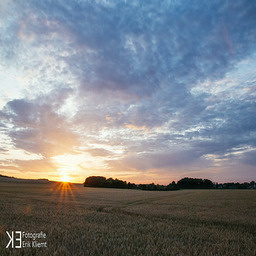

Step 1, G Loss: 10.847713470458984, D Loss: 1.9553508758544922
Step 2, G Loss: 10.439635276794434, D Loss: 1.9177160263061523
Step 3, G Loss: 11.908402442932129, D Loss: 1.8675596714019775
Step 4, G Loss: 9.904061317443848, D Loss: 1.8250389099121094
Step 5, G Loss: 9.725019454956055, D Loss: 1.7672245502471924
Step 6, G Loss: 11.051604270935059, D Loss: 1.7074851989746094
Step 7, G Loss: 10.12368106842041, D Loss: 1.6522570848464966
Step 8, G Loss: 9.161060333251953, D Loss: 1.5934538841247559
Step 9, G Loss: 11.072200775146484, D Loss: 1.541473627090454
Step 10, G Loss: 8.915122985839844, D Loss: 1.4966485500335693
Step 11, G Loss: 10.14548110961914, D Loss: 1.4403988122940063
Step 12, G Loss: 9.186643600463867, D Loss: 1.3764336109161377
Step 13, G Loss: 9.739836692810059, D Loss: 1.329621434211731
Step 14, G Loss: 8.914957046508789, D Loss: 1.2756619453430176
Step 15, G Loss: 9.882087707519531, D Loss: 1.234642744064331
Step 16, G Loss: 8.498011589050293, D Loss: 1.2290890216827393

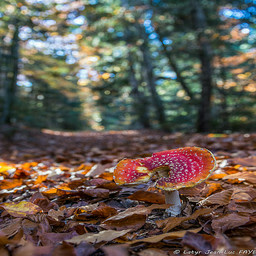

Step 401, G Loss: 3.8290557861328125, D Loss: 0.004605969879776239
Step 402, G Loss: 3.718351125717163, D Loss: 0.0028054474387317896
Step 403, G Loss: 3.788626194000244, D Loss: 0.004577591083943844
Step 404, G Loss: 3.599757671356201, D Loss: 0.00321312271989882
Step 405, G Loss: 3.8119354248046875, D Loss: 0.004551582038402557
Step 406, G Loss: 4.021958351135254, D Loss: 0.0052418820559978485
Step 407, G Loss: 3.820587396621704, D Loss: 0.004913915880024433
Step 408, G Loss: 3.7880563735961914, D Loss: 0.0060309311375021935
Step 409, G Loss: 3.6062965393066406, D Loss: 0.0031110490672290325
Step 410, G Loss: 3.714082956314087, D Loss: 0.006345891393721104
Step 411, G Loss: 3.7214035987854004, D Loss: 0.0034717866219580173
Step 412, G Loss: 3.4653587341308594, D Loss: 0.004224956966936588
Step 413, G Loss: 3.8254032135009766, D Loss: 0.004323231056332588
Step 414, G Loss: 4.158810138702393, D Loss: 0.003882677061483264
Step 415, G Loss: 3.9079670906066895, D Loss: 0.00369598483666777

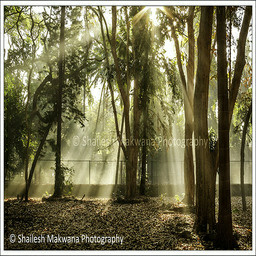

Step 801, G Loss: 3.1891908645629883, D Loss: 0.0014856746420264244
Step 802, G Loss: 3.1417248249053955, D Loss: 0.0015340184327214956
Step 803, G Loss: 3.431676149368286, D Loss: 0.0014502713456749916
Step 804, G Loss: 3.5489511489868164, D Loss: 0.0014606652548536658
Step 805, G Loss: 3.428819417953491, D Loss: 0.0016971614677459002
Step 806, G Loss: 3.2375683784484863, D Loss: 0.001336274784989655
Step 807, G Loss: 3.358609199523926, D Loss: 0.0022902609780430794
Step 808, G Loss: 3.4585742950439453, D Loss: 0.0026567045133560896
Step 809, G Loss: 3.363227128982544, D Loss: 0.0030955616384744644
Epoch: 28
Step 810, G Loss: 3.303823471069336, D Loss: 0.0014347260585054755
Step 811, G Loss: 3.1703848838806152, D Loss: 0.0027846277225762606
Step 812, G Loss: 3.4749703407287598, D Loss: 0.002193370833992958
Step 813, G Loss: 3.410101890563965, D Loss: 0.0017715876456350088
Step 814, G Loss: 3.5417141914367676, D Loss: 0.0014924849383533
Step 815, G Loss: 3.271052837371826, D Loss: 0.00

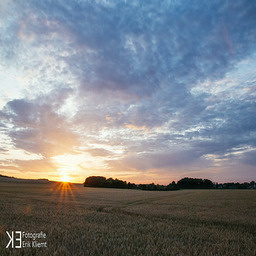

Step 1201, G Loss: 3.263704776763916, D Loss: 0.0008802541997283697
Step 1202, G Loss: 3.478132486343384, D Loss: 0.0009810804622247815
Step 1203, G Loss: 3.3659329414367676, D Loss: 0.0010771017987281084
Step 1204, G Loss: 3.2891972064971924, D Loss: 0.0008279777248390019
Step 1205, G Loss: 3.136995315551758, D Loss: 0.0008269647369161248
Step 1206, G Loss: 3.4604220390319824, D Loss: 0.0010585810523480177
Step 1207, G Loss: 3.2840800285339355, D Loss: 0.0010363010223954916
Step 1208, G Loss: 3.187753200531006, D Loss: 0.0008316267048940063
Step 1209, G Loss: 3.302595376968384, D Loss: 0.0008762703510001302
Step 1210, G Loss: 3.1832728385925293, D Loss: 0.0008106790482997894
Step 1211, G Loss: 3.420527458190918, D Loss: 0.0009455673862248659
Step 1212, G Loss: 3.279096841812134, D Loss: 0.0006490143132396042
Step 1213, G Loss: 3.199709892272949, D Loss: 0.0009312566835433245
Step 1214, G Loss: 3.195502281188965, D Loss: 0.0006830510683357716
Step 1215, G Loss: 3.3019258975982666, D Lo

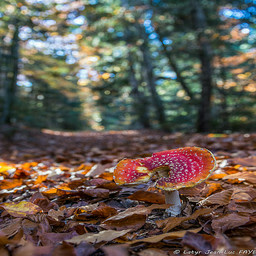

Step 1601, G Loss: 3.09970760345459, D Loss: 0.0006187944090925157
Step 1602, G Loss: 3.0136289596557617, D Loss: 0.0005265793879516423
Step 1603, G Loss: 3.021984100341797, D Loss: 0.0005441391840577126
Step 1604, G Loss: 2.993926525115967, D Loss: 0.0004460694908630103
Step 1605, G Loss: 2.991239070892334, D Loss: 0.000557019142434001
Step 1606, G Loss: 3.189242362976074, D Loss: 0.0004855322767980397
Step 1607, G Loss: 3.021116256713867, D Loss: 0.00047003733925521374
Step 1608, G Loss: 2.9999656677246094, D Loss: 0.0005547709297388792
Step 1609, G Loss: 2.9667279720306396, D Loss: 0.00047473417362198234
Step 1610, G Loss: 3.035940647125244, D Loss: 0.00088656967272982
Step 1611, G Loss: 2.905817985534668, D Loss: 0.0005142998415976763
Step 1612, G Loss: 2.87160587310791, D Loss: 0.0005905010038986802
Step 1613, G Loss: 3.073458194732666, D Loss: 0.00046316743828356266
Step 1614, G Loss: 3.1579320430755615, D Loss: 0.0005294292932376266
Step 1615, G Loss: 3.1014347076416016, D Loss:

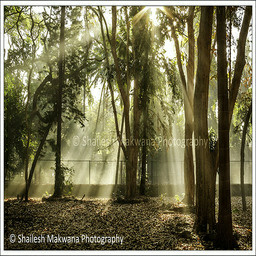

Step 2001, G Loss: 2.852510929107666, D Loss: 0.0004613982164300978
Step 2002, G Loss: 2.893160343170166, D Loss: 0.0004009109688922763
Step 2003, G Loss: 2.985365629196167, D Loss: 0.0003777298843488097
Step 2004, G Loss: 3.115093231201172, D Loss: 0.00045138236600905657
Step 2005, G Loss: 3.087351083755493, D Loss: 0.0004636826924979687
Step 2006, G Loss: 3.0197689533233643, D Loss: 0.0005069168983027339
Step 2007, G Loss: 3.017184257507324, D Loss: 0.00047805841313675046
Step 2008, G Loss: 3.0560824871063232, D Loss: 0.0008927096496336162
Step 2009, G Loss: 2.8876020908355713, D Loss: 0.0005448296433314681
Epoch: 68
Step 2010, G Loss: 2.9360971450805664, D Loss: 0.000617584097199142
Step 2011, G Loss: 2.953192949295044, D Loss: 0.0003810445487033576
Step 2012, G Loss: 3.0830984115600586, D Loss: 0.0006062753382138908
Step 2013, G Loss: 3.0855956077575684, D Loss: 0.0004108558059670031
Step 2014, G Loss: 3.0824286937713623, D Loss: 0.0005826938431710005
Step 2015, G Loss: 2.945882320

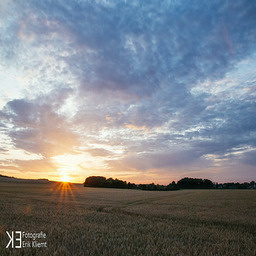

Step 2401, G Loss: 2.7478742599487305, D Loss: 0.00028851866954937577
Step 2402, G Loss: 2.9250476360321045, D Loss: 0.000283064873656258
Step 2403, G Loss: 2.916436195373535, D Loss: 0.0003296357172075659
Step 2404, G Loss: 2.9023196697235107, D Loss: 0.00026785372756421566
Step 2405, G Loss: 2.859464168548584, D Loss: 0.00023801656789146364
Step 2406, G Loss: 2.8891444206237793, D Loss: 0.0002915444492828101
Step 2407, G Loss: 2.8679423332214355, D Loss: 0.0002990504144690931
Step 2408, G Loss: 2.771915912628174, D Loss: 0.00028558261692523956
Step 2409, G Loss: 2.8839340209960938, D Loss: 0.00022262257698457688
Step 2410, G Loss: 2.8635952472686768, D Loss: 0.0002533061197027564
Step 2411, G Loss: 2.9860620498657227, D Loss: 0.0002894439676310867
Step 2412, G Loss: 2.8486993312835693, D Loss: 0.00023025447444524616
Step 2413, G Loss: 2.857264518737793, D Loss: 0.00026726379292085767
Step 2414, G Loss: 2.846710205078125, D Loss: 0.00021782799740321934
Step 2415, G Loss: 3.00853323936

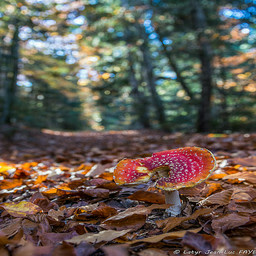

Step 2801, G Loss: 2.9183030128479004, D Loss: 0.00039122928865253925
Step 2802, G Loss: 2.8026161193847656, D Loss: 0.0002625696361064911
Step 2803, G Loss: 2.820507764816284, D Loss: 0.0004924964159727097
Step 2804, G Loss: 2.7697038650512695, D Loss: 0.00027432176284492016
Step 2805, G Loss: 2.8536553382873535, D Loss: 0.0002704486541915685
Step 2806, G Loss: 2.9649431705474854, D Loss: 0.0003926047938875854
Step 2807, G Loss: 2.8933942317962646, D Loss: 0.000265792099526152
Step 2808, G Loss: 2.8324077129364014, D Loss: 0.00031011487590149045
Step 2809, G Loss: 2.821606397628784, D Loss: 0.0003258099895901978
Step 2810, G Loss: 2.8728926181793213, D Loss: 0.0003989885444752872
Step 2811, G Loss: 2.7400877475738525, D Loss: 0.0004935553297400475
Step 2812, G Loss: 2.8466811180114746, D Loss: 0.00044734240509569645
Step 2813, G Loss: 2.8645424842834473, D Loss: 0.00017703793128021061
Step 2814, G Loss: 2.9260458946228027, D Loss: 0.0004139248630963266
Step 2815, G Loss: 2.96713018417

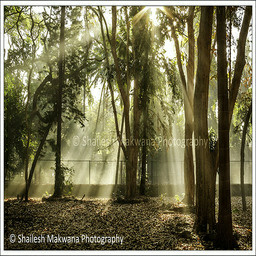

Step 3201, G Loss: 2.660703182220459, D Loss: 0.0003598489856813103
Step 3202, G Loss: 2.6973485946655273, D Loss: 0.00028846526402048767
Step 3203, G Loss: 2.78214430809021, D Loss: 0.00034718718961812556
Step 3204, G Loss: 2.8213891983032227, D Loss: 0.0003061486058868468
Step 3205, G Loss: 2.893866539001465, D Loss: 0.0003001344739459455
Step 3206, G Loss: 2.7313079833984375, D Loss: 0.00035525919520296156
Step 3207, G Loss: 2.7979233264923096, D Loss: 0.00024406304873991758
Step 3208, G Loss: 2.8457016944885254, D Loss: 0.000529424927663058
Step 3209, G Loss: 2.7340328693389893, D Loss: 0.0002516559907235205
Epoch: 108
Step 3210, G Loss: 2.755734920501709, D Loss: 0.0005144602619111538
Step 3211, G Loss: 2.704646110534668, D Loss: 0.00021967205975670367
Step 3212, G Loss: 2.8405637741088867, D Loss: 0.0003670639416668564
Step 3213, G Loss: 2.830822467803955, D Loss: 0.0002143796591553837
Step 3214, G Loss: 2.8276398181915283, D Loss: 0.00040974782314151525
Step 3215, G Loss: 2.8152

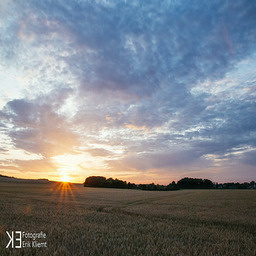

Step 3601, G Loss: 2.699678897857666, D Loss: 0.0006186490063555539
Step 3602, G Loss: 2.8166451454162598, D Loss: 0.0006213264423422515
Step 3603, G Loss: 2.8642022609710693, D Loss: 0.0005349505809135735
Step 3604, G Loss: 2.8528876304626465, D Loss: 0.0006174377631396055
Step 3605, G Loss: 2.760213851928711, D Loss: 0.0004806172801181674
Step 3606, G Loss: 2.735555410385132, D Loss: 0.0005097836838103831
Step 3607, G Loss: 2.7311010360717773, D Loss: 0.000391896057408303
Step 3608, G Loss: 2.7160353660583496, D Loss: 0.0005341981304809451
Step 3609, G Loss: 2.804168462753296, D Loss: 0.000399561133235693
Step 3610, G Loss: 2.745401382446289, D Loss: 0.0004089165013283491
Step 3611, G Loss: 2.86564302444458, D Loss: 0.0003255749470554292
Step 3612, G Loss: 2.803893804550171, D Loss: 0.0002953861257992685
Step 3613, G Loss: 2.7809975147247314, D Loss: 0.00036228098906576633
Step 3614, G Loss: 2.7315356731414795, D Loss: 0.0002237540320493281
Step 3615, G Loss: 2.7901253700256348, D Lo

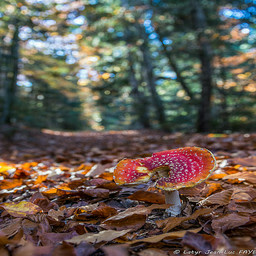

Step 4001, G Loss: 2.784191608428955, D Loss: 0.00021399807883426547
Step 4002, G Loss: 2.6994290351867676, D Loss: 0.00018549418018665165
Step 4003, G Loss: 2.7529940605163574, D Loss: 0.0002076860546367243
Step 4004, G Loss: 2.6559464931488037, D Loss: 0.00017402404046151787
Step 4005, G Loss: 2.6914167404174805, D Loss: 0.00015766918659210205
Step 4006, G Loss: 2.818714141845703, D Loss: 0.00016772883827798069
Step 4007, G Loss: 2.7650163173675537, D Loss: 0.00013083647354505956
Step 4008, G Loss: 2.686495780944824, D Loss: 0.0001310689258389175
Step 4009, G Loss: 2.660524606704712, D Loss: 0.00012987313675694168
Step 4010, G Loss: 2.708306312561035, D Loss: 0.00019641195831354707
Step 4011, G Loss: 2.6144580841064453, D Loss: 0.00015162689669523388
Step 4012, G Loss: 2.682434320449829, D Loss: 0.00013192076585255563
Step 4013, G Loss: 2.7213823795318604, D Loss: 0.00010938757623080164
Step 4014, G Loss: 2.770869255065918, D Loss: 0.00011829023424070328
Step 4015, G Loss: 2.78940248

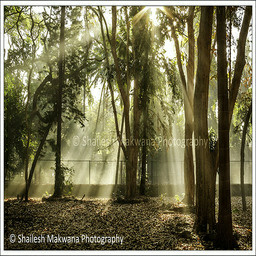

Step 4401, G Loss: 2.6556429862976074, D Loss: 0.0001773006224539131
Step 4402, G Loss: 2.7000789642333984, D Loss: 0.00017413125897292048
Step 4403, G Loss: 2.7489137649536133, D Loss: 0.00014051233301870525
Step 4404, G Loss: 2.778529167175293, D Loss: 0.00026186465402133763
Step 4405, G Loss: 2.8282501697540283, D Loss: 0.00014452359755523503
Step 4406, G Loss: 2.6607539653778076, D Loss: 0.0002555017126724124
Step 4407, G Loss: 2.7381539344787598, D Loss: 0.00027302856324240565
Step 4408, G Loss: 2.777437448501587, D Loss: 0.00023203890305012465
Step 4409, G Loss: 2.6679913997650146, D Loss: 0.0003475985140539706
Epoch: 148
Step 4410, G Loss: 2.717633008956909, D Loss: 0.00013316301919985563
Step 4411, G Loss: 2.7142410278320312, D Loss: 0.00023776173475198448
Step 4412, G Loss: 2.825826644897461, D Loss: 0.00013252778444439173
Step 4413, G Loss: 2.811574697494507, D Loss: 0.00023842121299821883
Step 4414, G Loss: 2.8157899379730225, D Loss: 0.0001495436590630561
Step 4415, G Loss:

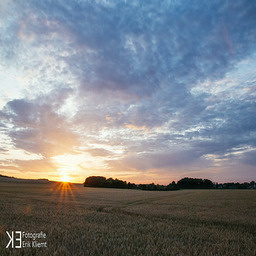

Step 4801, G Loss: 2.728212594985962, D Loss: 0.00020921937539242208
Step 4802, G Loss: 2.826871395111084, D Loss: 0.00023788967519067228
Step 4803, G Loss: 2.8294427394866943, D Loss: 0.0002261995687149465
Step 4804, G Loss: 2.7749743461608887, D Loss: 0.00025830103550106287
Step 4805, G Loss: 2.691822052001953, D Loss: 0.00018568223458714783
Step 4806, G Loss: 2.7429094314575195, D Loss: 0.00032197413383983076
Step 4807, G Loss: 2.7016162872314453, D Loss: 0.00026276346761733294
Step 4808, G Loss: 2.676377534866333, D Loss: 0.00028294019284658134
Step 4809, G Loss: 2.7226953506469727, D Loss: 0.0003218218043912202
Step 4810, G Loss: 2.7229907512664795, D Loss: 0.00017739165923558176
Step 4811, G Loss: 2.840144395828247, D Loss: 0.00038601859705522656
Step 4812, G Loss: 2.7774078845977783, D Loss: 0.00012632216385100037
Step 4813, G Loss: 2.7893552780151367, D Loss: 0.0004037705948576331
Step 4814, G Loss: 2.6636786460876465, D Loss: 0.0001395932922605425
Step 4815, G Loss: 2.67597055

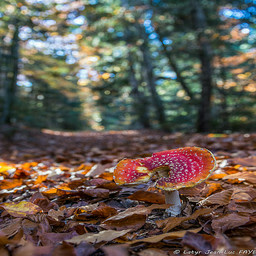

Step 5201, G Loss: 2.6918392181396484, D Loss: 0.0002813145110849291
Step 5202, G Loss: 2.630988597869873, D Loss: 0.00018300043302588165
Step 5203, G Loss: 2.6614041328430176, D Loss: 0.00014173449017107487
Step 5204, G Loss: 2.5857343673706055, D Loss: 0.00022149694268591702
Step 5205, G Loss: 2.6537747383117676, D Loss: 0.00011048440501326695
Step 5206, G Loss: 2.770246744155884, D Loss: 0.0002187043719459325
Step 5207, G Loss: 2.7336559295654297, D Loss: 0.00019347647321410477
Step 5208, G Loss: 2.69180965423584, D Loss: 0.00010623746493365616
Step 5209, G Loss: 2.6756057739257812, D Loss: 0.00017831590957939625
Step 5210, G Loss: 2.6778740882873535, D Loss: 0.00013873101852368563
Step 5211, G Loss: 2.6289639472961426, D Loss: 0.0001333394175162539
Step 5212, G Loss: 2.6616528034210205, D Loss: 0.0001694459206191823
Step 5213, G Loss: 2.638312816619873, D Loss: 9.267893619835377e-05
Step 5214, G Loss: 2.739591598510742, D Loss: 0.00023803110525477678
Step 5215, G Loss: 2.7993509769

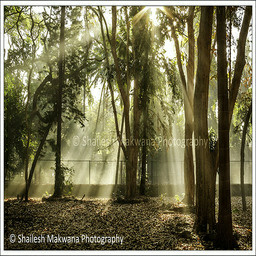

Step 5601, G Loss: 2.5531744956970215, D Loss: 0.0001419440668541938
Step 5602, G Loss: 2.5767884254455566, D Loss: 7.025475497357547e-05
Step 5603, G Loss: 2.642608404159546, D Loss: 0.00012847967445850372
Step 5604, G Loss: 2.6617846488952637, D Loss: 6.094082345953211e-05
Step 5605, G Loss: 2.744450330734253, D Loss: 0.00012534343113657087
Step 5606, G Loss: 2.560788631439209, D Loss: 6.39214413240552e-05
Step 5607, G Loss: 2.710435390472412, D Loss: 0.00011006452405126765
Step 5608, G Loss: 2.747910499572754, D Loss: 0.0001110798548324965
Step 5609, G Loss: 2.604980707168579, D Loss: 9.036270785145462e-05
Epoch: 188
Step 5610, G Loss: 2.6509628295898438, D Loss: 9.48480301303789e-05
Step 5611, G Loss: 2.6128058433532715, D Loss: 6.135820149211213e-05
Step 5612, G Loss: 2.7022929191589355, D Loss: 9.434703679289669e-05
Step 5613, G Loss: 2.7084412574768066, D Loss: 5.488578608492389e-05
Step 5614, G Loss: 2.64595627784729, D Loss: 9.176376624964178e-05
Step 5615, G Loss: 2.616684198

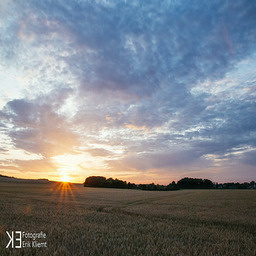

Step 6001, G Loss: 2.5852246284484863, D Loss: 0.0003433391684666276
Step 6002, G Loss: 2.6697428226470947, D Loss: 0.001043515745550394
Step 6003, G Loss: 2.6543588638305664, D Loss: 0.0002636741555761546
Step 6004, G Loss: 2.6267309188842773, D Loss: 0.0010891378624364734
Step 6005, G Loss: 2.600119113922119, D Loss: 0.0005716426530852914
Step 6006, G Loss: 2.6440024375915527, D Loss: 0.00047208761679939926
Step 6007, G Loss: 2.6242218017578125, D Loss: 0.0004366925568319857
Step 6008, G Loss: 2.610354423522949, D Loss: 0.00048157715355046093
Step 6009, G Loss: 2.7094430923461914, D Loss: 0.0003356380620971322
Step 6010, G Loss: 2.6786789894104004, D Loss: 0.00044094541226513684
Step 6011, G Loss: 2.7584097385406494, D Loss: 0.0003050318919122219
Step 6012, G Loss: 2.6581838130950928, D Loss: 0.00040154592716135085
Step 6013, G Loss: 2.687771797180176, D Loss: 0.0002267736999783665
Step 6014, G Loss: 2.6314172744750977, D Loss: 0.0003781324776355177
Step 6015, G Loss: 2.6875855922698

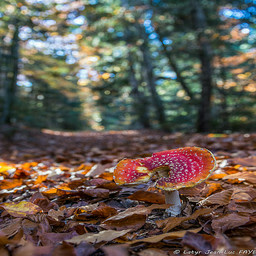

Step 6401, G Loss: 2.656642436981201, D Loss: 9.046937339007854e-05
Step 6402, G Loss: 2.6123969554901123, D Loss: 5.260979742160998e-05
Step 6403, G Loss: 2.6230921745300293, D Loss: 8.151881047524512e-05
Step 6404, G Loss: 2.539816379547119, D Loss: 6.726705032633618e-05
Step 6405, G Loss: 2.5797574520111084, D Loss: 7.976307824719697e-05
Step 6406, G Loss: 2.699723958969116, D Loss: 5.835944466525689e-05
Step 6407, G Loss: 2.697211742401123, D Loss: 8.185257320292294e-05
Step 6408, G Loss: 2.590017795562744, D Loss: 5.6859782489482313e-05
Step 6409, G Loss: 2.6026008129119873, D Loss: 7.98701512394473e-05
Step 6410, G Loss: 2.6107406616210938, D Loss: 0.0002367210399825126
Step 6411, G Loss: 2.54728627204895, D Loss: 0.000131070934003219
Step 6412, G Loss: 2.564533233642578, D Loss: 8.369318675249815e-05
Step 6413, G Loss: 2.6586663722991943, D Loss: 0.00011380585056031123
Step 6414, G Loss: 2.6931569576263428, D Loss: 0.00010423367348266765
Step 6415, G Loss: 2.7435219287872314, D 

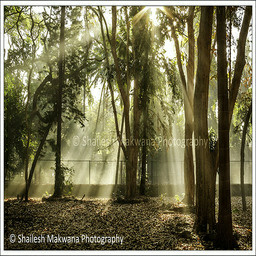

Step 6801, G Loss: 2.5098800659179688, D Loss: 0.00020025225239805877
Step 6802, G Loss: 2.5200395584106445, D Loss: 0.00016962821246124804
Step 6803, G Loss: 2.608098030090332, D Loss: 0.00029224270838312805
Step 6804, G Loss: 2.66790771484375, D Loss: 0.0001286973711103201
Step 6805, G Loss: 2.721339225769043, D Loss: 0.0003693995822686702
Step 6806, G Loss: 2.562074661254883, D Loss: 0.00023915283964015543
Step 6807, G Loss: 2.651756763458252, D Loss: 0.0003057618741877377
Step 6808, G Loss: 2.655089855194092, D Loss: 0.0003497684665489942
Step 6809, G Loss: 2.5943665504455566, D Loss: 0.00022595243353862315
Epoch: 228
Step 6810, G Loss: 2.6181371212005615, D Loss: 0.0003167663235217333
Step 6811, G Loss: 2.6690986156463623, D Loss: 0.00023092453193385154
Step 6812, G Loss: 2.700124502182007, D Loss: 0.00039475440280511975
Step 6813, G Loss: 2.738023281097412, D Loss: 0.00019799091387540102
Step 6814, G Loss: 2.6438827514648438, D Loss: 0.0003688934084493667
Step 6815, G Loss: 2.632

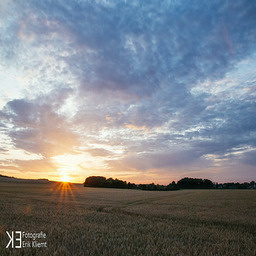

Step 7201, G Loss: 2.5786232948303223, D Loss: 6.0495600337162614e-05
Step 7202, G Loss: 2.6726863384246826, D Loss: 8.131669164868072e-05
Step 7203, G Loss: 2.6664159297943115, D Loss: 7.635954534634948e-05
Step 7204, G Loss: 2.6227145195007324, D Loss: 0.00013076697359792888
Step 7205, G Loss: 2.5858099460601807, D Loss: 9.445381874684244e-05
Step 7206, G Loss: 2.6570887565612793, D Loss: 9.251129813492298e-05
Step 7207, G Loss: 2.637112617492676, D Loss: 0.00014111684868112206
Step 7208, G Loss: 2.5996487140655518, D Loss: 0.00010934816964436322
Step 7209, G Loss: 2.591017246246338, D Loss: 0.00014318338071461767
Step 7210, G Loss: 2.6133010387420654, D Loss: 0.00011129956692457199
Step 7211, G Loss: 2.6879026889801025, D Loss: 0.0001215022784890607
Step 7212, G Loss: 2.606736660003662, D Loss: 0.00012351086479611695
Step 7213, G Loss: 2.6205644607543945, D Loss: 0.00010827532241819426
Step 7214, G Loss: 2.567465305328369, D Loss: 0.00010901855421252549
Step 7215, G Loss: 2.63105678

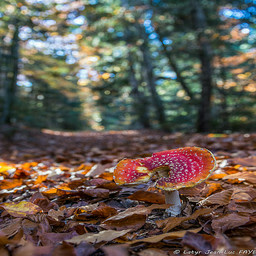

Step 7601, G Loss: 2.619141101837158, D Loss: 7.118209759937599e-05
Step 7602, G Loss: 2.5682220458984375, D Loss: 0.00010594566992949694
Step 7603, G Loss: 2.569338798522949, D Loss: 6.575234874617308e-05
Step 7604, G Loss: 2.5382845401763916, D Loss: 9.439451969228685e-05
Step 7605, G Loss: 2.594245195388794, D Loss: 6.653292803093791e-05
Step 7606, G Loss: 2.6527066230773926, D Loss: 6.816748646087945e-05
Step 7607, G Loss: 2.624290943145752, D Loss: 5.3427822422236204e-05
Step 7608, G Loss: 2.570359468460083, D Loss: 7.070248830132186e-05
Step 7609, G Loss: 2.5752649307250977, D Loss: 5.417390639195219e-05
Step 7610, G Loss: 2.560170888900757, D Loss: 7.129252480808645e-05
Step 7611, G Loss: 2.4841582775115967, D Loss: 4.758577415486798e-05
Step 7612, G Loss: 2.5221681594848633, D Loss: 5.194230834604241e-05
Step 7613, G Loss: 2.657979965209961, D Loss: 6.180514174047858e-05
Step 7614, G Loss: 2.6365087032318115, D Loss: 5.841701931785792e-05
Step 7615, G Loss: 2.6852335929870605, 

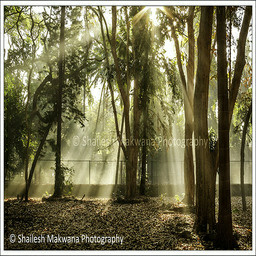

Step 8001, G Loss: 2.4897119998931885, D Loss: 0.000302422879030928
Step 8002, G Loss: 2.5714268684387207, D Loss: 0.00016651379701215774
Step 8003, G Loss: 2.637561798095703, D Loss: 0.00015241328219417483
Step 8004, G Loss: 2.6814615726470947, D Loss: 0.00015378661919385195
Step 8005, G Loss: 2.699237108230591, D Loss: 0.00020024782861582935
Step 8006, G Loss: 2.583798885345459, D Loss: 0.00015105876082088798
Step 8007, G Loss: 2.593597650527954, D Loss: 0.00017238424334209412
Step 8008, G Loss: 2.6218173503875732, D Loss: 0.0002666152431629598
Step 8009, G Loss: 2.5169591903686523, D Loss: 0.00021318020299077034
Epoch: 268
Step 8010, G Loss: 2.559880256652832, D Loss: 0.00015940293087624013
Step 8011, G Loss: 2.567922592163086, D Loss: 0.0001824006176320836
Step 8012, G Loss: 2.64374041557312, D Loss: 0.00016378813597839326
Step 8013, G Loss: 2.6422371864318848, D Loss: 0.00014689851377625018
Step 8014, G Loss: 2.5746450424194336, D Loss: 0.00022424345661420375
Step 8015, G Loss: 2.

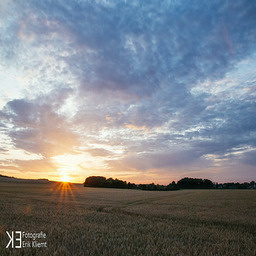

Step 8401, G Loss: 2.554544448852539, D Loss: 6.835677049821243e-05
Step 8402, G Loss: 2.615830898284912, D Loss: 0.00013693002983927727
Step 8403, G Loss: 2.6273996829986572, D Loss: 9.843141015153378e-05
Step 8404, G Loss: 2.584322690963745, D Loss: 9.745548595674336e-05
Step 8405, G Loss: 2.5452823638916016, D Loss: 0.00010072588338516653
Step 8406, G Loss: 2.584298849105835, D Loss: 7.951611769385636e-05
Step 8407, G Loss: 2.5462279319763184, D Loss: 0.00015248762792907655
Step 8408, G Loss: 2.509525775909424, D Loss: 0.00015958593576215208
Step 8409, G Loss: 2.558718204498291, D Loss: 7.929002458695322e-05
Step 8410, G Loss: 2.5124194622039795, D Loss: 0.000140060466947034
Step 8411, G Loss: 2.5869598388671875, D Loss: 0.0001419312902726233
Step 8412, G Loss: 2.519259214401245, D Loss: 0.0001111955862143077
Step 8413, G Loss: 2.5699658393859863, D Loss: 0.00011687021469697356
Step 8414, G Loss: 2.4976398944854736, D Loss: 0.00011839743820019066
Step 8415, G Loss: 2.535552978515625

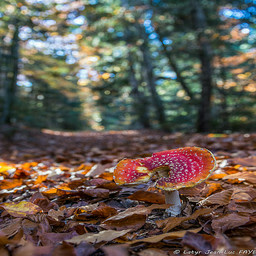

Step 8801, G Loss: 2.602595090866089, D Loss: 6.889956421218812e-05
Step 8802, G Loss: 2.5512375831604004, D Loss: 7.279797864612192e-05
Step 8803, G Loss: 2.5438828468322754, D Loss: 8.240234456025064e-05
Step 8804, G Loss: 2.506718635559082, D Loss: 5.980623245704919e-05
Step 8805, G Loss: 2.5569229125976562, D Loss: 6.939040758879855e-05
Step 8806, G Loss: 2.6366922855377197, D Loss: 6.774156645406038e-05
Step 8807, G Loss: 2.5921568870544434, D Loss: 7.489282143069431e-05
Step 8808, G Loss: 2.5523903369903564, D Loss: 8.572977094445378e-05
Step 8809, G Loss: 2.541600465774536, D Loss: 7.518770871683955e-05
Step 8810, G Loss: 2.5652246475219727, D Loss: 0.00011961387644987553
Step 8811, G Loss: 2.46802020072937, D Loss: 9.889146167552099e-05
Step 8812, G Loss: 2.5066566467285156, D Loss: 8.961405546870083e-05
Step 8813, G Loss: 2.5914266109466553, D Loss: 0.0001085617404896766
Step 8814, G Loss: 2.6224067211151123, D Loss: 0.00014040051610209048
Step 8815, G Loss: 2.629288673400879,

In [19]:
tf.get_logger().setLevel('ERROR')
from IPython.display import display
from PIL import Image
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Convert TensorFlow datasets to NumPy arrays
photo_array = np.array(list(photo_ds.as_numpy_iterator()))
monet_array = np.array(list(augmented_monet_ds.as_numpy_iterator()))

# Split your photo and monet datasets into training and validation sets
photo_train, photo_validation = train_test_split(photo_array, test_size=0.2, random_state=42)
monet_train, monet_validation = train_test_split(monet_array, test_size=0.2, random_state=42)

# Create TensorFlow datasets from NumPy arrays
photo_train_ds = tf.data.Dataset.from_tensor_slices(photo_train)
monet_train_ds = tf.data.Dataset.from_tensor_slices(monet_train)

# Create batched datasets for training
batch_size = 8  # Adjust as needed

photo_train_batched = photo_train_ds.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
monet_train_batched = monet_train_ds.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

# Initialize models
g_a2b, g_b2a, d_a, d_b, adv_model = CycleGAN()

# Define some hyperparameters
epochs = 300
batch_size = 16  # Adjust as needed
generate_every_steps = 400  # specify frequency for generating images

adv_model.optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0002)

# Training loop
step = 0  # step counter for saving and generating images

for epoch in range(epochs):
    print(f"Epoch: {epoch + 1}")

    # Iterate over the dataset batches
    for real_a, real_b in tf.data.Dataset.zip((photo_train_batched, monet_train_batched)):
        # Ensure batches are of the same size
        if len(real_a) != len(real_b):
            continue

        # Training Discriminators
        with tf.GradientTape() as tape:
            fake_b = g_a2b(real_a, training=True)
            fake_a = g_b2a(real_b, training=True)

            d_a_real = d_a(real_a, training=True)
            d_b_real = d_b(real_b, training=True)
            d_a_fake = d_a(fake_a, training=True)
            d_b_fake = d_b(fake_b, training=True)

            d_a_loss = tf.reduce_mean(tf.square(d_a_real - tf.ones_like(d_a_real))) + tf.reduce_mean(tf.square(d_a_fake))
            d_b_loss = tf.reduce_mean(tf.square(d_b_real - tf.ones_like(d_b_real))) + tf.reduce_mean(tf.square(d_b_fake))
            total_d_loss = d_a_loss + d_b_loss

        # Calculate gradients and apply updates
        d_gradients = tape.gradient(total_d_loss, d_a.trainable_variables + d_b.trainable_variables)
        adv_model.optimizer.apply_gradients(zip(d_gradients, d_a.trainable_variables + d_b.trainable_variables))

        # Training Generators
        with tf.GradientTape() as tape:
            fake_b = g_a2b(real_a, training=True)
            fake_a = g_b2a(real_b, training=True)

            recon_a = g_b2a(fake_b, training=True)
            recon_b = g_a2b(fake_a, training=True)

            d_a_fake = d_a(fake_a, training=True)
            d_b_fake = d_b(fake_b, training=True)

            adv_loss_a = tf.reduce_mean(tf.square(d_a_fake - tf.ones_like(d_a_fake)))
            adv_loss_b = tf.reduce_mean(tf.square(d_b_fake - tf.ones_like(d_b_fake)))
            total_adv_loss = adv_loss_a + adv_loss_b

            real_a_float = tf.cast(real_a, tf.float32) / 255.0
            real_b_float = tf.cast(real_b, tf.float32) / 255.0

            cycle_loss_a = tf.reduce_mean(tf.abs(real_a_float - recon_a))
            cycle_loss_b = tf.reduce_mean(tf.abs(real_b_float - recon_b))

            total_cycle_loss = cycle_loss_a + cycle_loss_b

            total_g_loss = total_adv_loss + 10.0 * total_cycle_loss

        # Calculate gradients and apply updates
        g_gradients = tape.gradient(total_g_loss, g_a2b.trainable_variables + g_b2a.trainable_variables)
        adv_model.optimizer.apply_gradients(zip(g_gradients, g_a2b.trainable_variables + g_b2a.trainable_variables))

        # Log losses
        print(f'Step {step}, G Loss: {total_g_loss}, D Loss: {total_d_loss}', flush=True)


        # Generate and save sample images to visually assess progress
        if step % generate_every_steps == 0:
            # Generate images
            generated_images_a = g_a2b(real_a, training=False)

            # Concatenate real and generated images for comparison
            comparison_image_a = tf.concat([real_a_float, generated_images_a], axis=0)

            # Convert the NumPy array to an image
            comparison_image_a = Image.fromarray(np.uint8(comparison_image_a[0].numpy() * 255))

            # Display the image
            display(comparison_image_a)

        step += 1  # increase step counter


## Visualization of Predicted Images
Here are a few samples on the left predcited with the more Monet images on the right.  Not the quality I desired but you can see the effect.

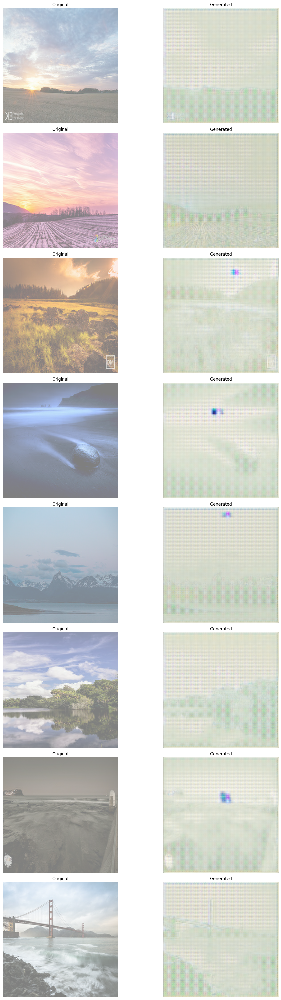

In [26]:
def display_generated_images(model, test_input_batch):
    # Ensure data type is float32 and values range between 0 and 1
    test_input_batch = tf.cast(test_input_batch, tf.float32) / 255.0

    # Get the batch of predictions
    predictions = model(test_input_batch, training=False)

    # Extract the batch size
    batch_size = test_input_batch.shape[0]

    plt.figure(figsize=(15, 5 * batch_size))  # Adjusted the size for better view

    for i in range(batch_size):
        # Display original images
        plt.subplot(batch_size, 2, 2*i + 1)  # Display original on odd-numbered subplots
        plt.imshow(tf.squeeze(test_input_batch[i]) * 0.5 + 0.5)  # Assuming images are normalized to [-1, 1]
        plt.title("Original")
        plt.axis('off')

        # Display generated images
        plt.subplot(batch_size, 2, 2*i + 2)  # Display generated on even-numbered subplots
        plt.imshow(tf.squeeze(predictions[i]) * 0.5 + 0.5)  # Assuming images are normalized to [-1, 1]
        plt.title("Generated")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Extract a single batch for visualization
sample_photos_batch = next(iter(photo_train_batched))


# Generate and display images
display_generated_images(g_a2b, sample_photos_batch)


## Predictions across the dataset including converting output to jpgs and converting into the zipped submision file.

In [ ]:
import os
from tensorflow.keras.preprocessing.image import save_img
import zipfile
import tensorflow as tf

# Directory for generated images
output_directory = '/kaggle/working/generated_images'  # Use Kaggle's working directory
os.makedirs(output_directory, exist_ok=True)

# 1. Generate Monet-style images from photo dataset and save them:
for idx, photo in enumerate(photo_ds):
    photo_array = tf.expand_dims(photo, axis=0)  # Ensuring the photo has a batch dimension
    generated_image = g_a2b.predict(photo_array)  # Generate Monet-style image using predict method
    file_path = os.path.join(output_directory, f'monet_{idx}.jpg')
    save_img(file_path, generated_image[0] * 255)  # Save the image

# 2. Zip the images:
zipfile_name = '/kaggle/working/images.zip'  # Save the zip to Kaggle's working directory
with zipfile.ZipFile(zipfile_name, 'w') as zipf:
    for root, _, files in os.walk(output_directory):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.basename(file_path))  # Save the image in the zip with its base name



In [42]:
zipfile_name = '/kaggle/working/images.zip'  # Save the zip to Kaggle's working directory
with zipfile.ZipFile(zipfile_name, 'w') as zipf:
    for root, _, files in os.walk(output_directory):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.basename(file_path))  # Save the image in the zip with its base name

In [38]:
!mkdir -p ~/.kaggle
!cp /kaggle/input/kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


#  Results and Conclusions

I created two notebooks trying two different approaches.  The first was this CycleGAN approach which was recommended in the Kaggle competition and the second was a Pix2Pix approach recommended in  a Tensor Flow guide found at https://www.tensorflow.org/tutorials/generative/pix2pix   That approach focuses on a one way generator that emphasizes conversion from input to output,  I chose the cycleGan to submit as I had better results.  The Pix2Pix was very unstable and the generator loss never fell below 40 even with 300 epochs.   

With this cycleGan, the consistency created in the 2 way evaluation, produced stable and converging results that got me to a generator loss as low as 2.42.   The images gradually became more Monet like although the images were similar to the original but there were clarity issues. I performed 300 epochs over a 6 hour iteration.  Between the two approaches I probably ran traiing for an aggregate of at least 48 hours.  One problem I had was that I did all my work in Colab and was unable to use parallel processing with my subscription.  

I was unaware of the need to create the notebook in Kaggle as all my previous submissions allowed work outside of Kaggle and submission of a csv after the fact, so when I attempted the submission as usual I learned of the requirement to create the notebook in Kaggle,  I actually like that but it was an unpleasant late surprise.  

In summary,  the GAN variations were very interesting, though the coding was much more complex than the other Neural Network Models, but quite fascinating.  The training took much more time than the others as well to get decent results.  

Things I would do differently.  Learn how to perform parallel processing so my models would run faster.   Spend more time experimenting with different approaches.  Try using an open source model.   Tinker more with learning rates,  batch sizes and deeper networks.